# **CDK1–Plk1-APC Three-ODE System**
## ***Differential Equations***


$$
\frac{d(\text{CDK1}^*)}{dt} = \alpha_1 - \beta_1  CDK1^*\left( \frac{(\text{APC}^*)^{n_1}}{K_1^{n_1} + (\text{APC}^*)^{n_1}} \right)
$$

$$
\frac{d(\text{Plk1}^*)}{dt} = \alpha_2 (1 - \text{Plk1}^*) \left( \frac{(\text{CDK1}^*)^{n_2}}{K_2^{n_2} + (\text{CDK1}^*)^{n_2}} \right) - \beta_2 \text{Plk}^*
$$
$$
\frac{d(\text{APC}^*)}{dt} = \alpha_3 (1 - \text{APC}^*) \left( \frac{(\text{Plk1}^*)^{n_3}}{K_3^{n_3} + (\text{Plk1}^*)^{n_3}} \right) - \beta_3 \text{APC}^*
$$

## ***Parameters***
- $\alpha_1 = 0.3$
- $\alpha_2 = 3$
- $\alpha_3 = 3$
- $\beta_1 = 3$
- $\beta_2 = 1$
- $\beta_3 = 1$
- $K_1 = 0.5$
- $K_2 = 0.5$
- $K_3 = 0.5$
- $n_1 = 8$
- $n_2 = 8$
- $n_3 = 8$



In [1]:
import os, sys
print(sys.version)
print("--"* 60)
# print("Python executable:", sys.executable)
# print("--"* 60)
# print("PATH:", os.environ["PATH"])

3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]
------------------------------------------------------------------------------------------------------------------------


In [2]:
os.environ["PATH"] = ("/home/alka23224/miniconda3/envs/implicit_sindy/bin:" + os.environ["PATH"])

In [3]:
# -------------------------------
# Current working directory
# -------------------------------
# print(os.listdir())
current_dir = os.getcwd()
print(f"Current working directory: {current_dir}")


Current working directory: /home/alka23224/7_Cell_Cycle_Modelling


In [4]:
# -------------------------------
plot_dir = os.path.join(current_dir, "Plots_4")
os.makedirs(plot_dir, exist_ok=True) 

In [5]:
# -----------------------------
# Import Necessary Libraries
# -----------------------------
import numpy as np
import pandas as pd
import pysindy as ps
import sympy as sp
from matplotlib import pyplot as plt
from sympy import symbols, Eq, solve, Matrix, N, simplify, nsimplify
from scipy.optimize import fsolve
import plotly
import plotly.express as px
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D
from scipy.integrate import odeint
from pysindy.differentiation import FiniteDifference
from pysindy.optimizers.sindy_pi import SINDyPI
from sklearn.metrics import mean_squared_error, r2_score
from tqdm import tqdm
from tqdm.auto import tqdm
from IPython.display import display
from IPython.display import Image

In [6]:
# Created modules
from plot_utils import set_plot_style, set_spines_black
from network_utils import* 
from symbolic_model_utils import*
from sindypi_functions import*
from implicit_to_explicit import*
from steady_states_utils import*
# Apply global style 
set_plot_style(dpi=300)

In [7]:
# -------------------------------------------
# Define symbolic variable and parameters
# -------------------------------------------
x1, x2, x3 = symbols('x1, x2, x3')

alpha1, alpha2, alpha3 = 0.3, 3.0, 3.0
beta1, beta2, beta3 = 3.0, 1.0, 1.0
K1, K2, K3 = 0.5, 0.5, 0.5
n1, n2, n3 = 8, 8, 8
# Define the system of ODEs
dx1_dt = alpha1 - beta1*x1*x3**n1/(K1**n1 + x3**n1)
dx2_dt = alpha2*(1 - x2)*x1**n2/(K2**n2 + x1**n2) -beta2*x2
dx3_dt = alpha3*(1 - x3)*x2**n3/(K3**n3 + x2**n3) -beta3*x3
# Display the ODEs
print("The three dimensional ODEs are:")
print("dx1/dt =", dx1_dt)
print("dx2/dt =", dx2_dt)
print("dx3/dt =", dx3_dt)


The three dimensional ODEs are:
dx1/dt = -3.0*x1*x3**8/(x3**8 + 0.00390625) + 0.3
dx2/dt = x1**8*(3.0 - 3.0*x2)/(x1**8 + 0.00390625) - 1.0*x2
dx3/dt = x2**8*(3.0 - 3.0*x3)/(x2**8 + 0.00390625) - 1.0*x3


In [8]:
num_dx1, den_dx1 = rational_simplify(dx1_dt, expand_denominator=True)
num_dx2, den_dx2 = rational_simplify(dx2_dt, expand_denominator=True)
num_dx3, den_dx3 = rational_simplify(dx3_dt, expand_denominator=True)

# Display results
print("dx1_dt as a single rational function with:")
print("  Numerator:", num_dx1)
print("  Denominator:", den_dx1)
print("_"* 60)
print("dx2_dt as a single rational function with:")
print("  Numerator:", num_dx2)
print("  Denominator:", den_dx2)
print("_"* 60)
print("dx3_dt as a single rational function with:")
print("  Numerator:", num_dx3)
print("  Denominator:", den_dx3)

dx1_dt as a single rational function with:
  Numerator: -3.0*x1*x3**8 + 0.3*x3**8 + 0.001171875
  Denominator: 1.0*x3**8 + 0.00390625
____________________________________________________________
dx2_dt as a single rational function with:
  Numerator: -4.0*x1**8*x2 + 3.0*x1**8 - 0.00390625*x2
  Denominator: 1.0*x1**8 + 0.00390625
____________________________________________________________
dx3_dt as a single rational function with:
  Numerator: -4.0*x2**8*x3 + 3.0*x2**8 - 0.00390625*x3
  Denominator: 1.0*x2**8 + 0.00390625


In [9]:
# For x1: Highest degree monomial in the denominator is :x3**8
# For x2: Highest degree monomial in the denominator is  :x1**8
# For x3: Highest degree monomial in the denominator is  :x2**8

In [10]:
# Now, to find steady states
from scipy.optimize import fsolve
def ss_func(vars):
    x1, x2, x3 = vars
    dx1_dt = alpha1 - beta1*x1*x3**n1/(K1**n1 + x3**n1)
    dx2_dt = alpha2*(1 - x2)*x1**n2/(K2**n2 + x1**n2) -beta2*x2
    dx3_dt = alpha3*(1 - x3)*x2**n3/(K3**n3 + x2**n3) -beta3*x3
    return [dx1_dt, dx2_dt, dx3_dt]

ss = find_steady_states(
    ss_func,
    num_vars=3,
    num_samples=1000,
    tol=1e-8,
)


print("Steady states found numerically:")
for s in ss:
    x1_ss, x2_ss, x3_ss = s
    print(f"[{x1_ss:.3f}, {x2_ss:.3f}, {x3_ss:.3f}]")


Steady states found numerically:
[0.438, 0.436, 0.429]


In [11]:
# ------------------------------
# Define the Jacobian matrix of the system
# ------------------------------
vars = sp.Matrix([x1, x2, x3])
f = sp.Matrix([dx1_dt, dx2_dt, dx3_dt])
J = f.jacobian(vars).applyfunc(lambda expr: expr.evalf(3))

print("\nJacobian matrix:")
display(J)


Jacobian matrix:


Matrix([
[                                                                -3.0*x3**8/(x3**8 + 0.00391),                                                                                            0, 24.0*x1*x3**15/(x3**8 + 0.00391)**2 - 24.0*x1*x3**7/(x3**8 + 0.00391)],
[-8.0*x1**15*(3.0 - 3.0*x2)/(x1**8 + 0.00391)**2 + 8.0*x1**7*(3.0 - 3.0*x2)/(x1**8 + 0.00391),                                                           -3.0*x1**8/(x1**8 + 0.00391) - 1.0,                                                                     0],
[                                                                                           0, -8.0*x2**15*(3.0 - 3.0*x3)/(x2**8 + 0.00391)**2 + 8.0*x2**7*(3.0 - 3.0*x3)/(x2**8 + 0.00391),                                    -3.0*x2**8/(x2**8 + 0.00391) - 1.0]])

In [12]:
# ------------------------------------------------------------------
#  Evaluate Jacobian and eigenvalues at each steady state
# ------------------------------------------------------------------
J_at_ss = []

for i, s in enumerate(ss, 1):
    # Substitution dictionary for the steady state
    subs_dict = {x1: s[0], x2: s[1], x3: s[2]} 
    
    # Substitute into symbolic Jacobian
    J_sub = J.subs(subs_dict)
    
    # Compute symbolic eigenvalues 
    eigs = J_sub.eigenvals()
    J_eval = J_sub.evalf(3)
    J_at_ss.append(J_eval)

    # Print Jacobian
    coord_str = f"{float(s[0]):.3f}, {float(s[1]):.3f}, {float(s[2]):.3f}"
    print(f"\nJacobian at SS {i} = ({coord_str}):")
    sp.pprint(J_eval)

    # Print eigenvalues
    print(f"Eigenvalues at SS {i}:")
    for ev, mult in eigs.items():
        print(f"  {ev.evalf(3)}  (×{mult})")



Jacobian at SS 1 = (0.438, 0.436, 0.429):
⎡-0.685    0    -4.31⎤
⎢                    ⎥
⎢ 5.91   -1.77    0  ⎥
⎢                    ⎥
⎣  0      5.9   -1.75⎦
Eigenvalues at SS 1:
  -6.75 + 3.21e-64*I  (×1)
  1.27 - 4.58*I  (×1)
  1.27 + 4.58*I  (×1)



Interaction network near SS 1 = (0.438, 0.436, 0.429):


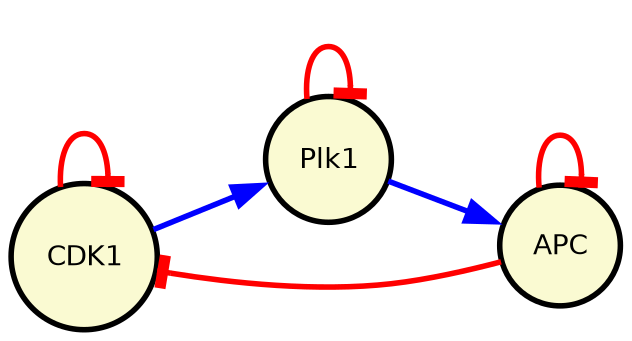

In [13]:
nodes = ["CDK1","Plk1", "APC"]
# ----------------------------------
#  Visualize interaction networks 
# ----------------------------------
try:
    Jacobians_np = [np.array(J_ss.tolist(), dtype=float) for J_ss in J_at_ss]
    for i, (J_np, ss_point) in enumerate(zip(Jacobians_np, ss), 1):
        output_path = f"Plots_4/CDK1_Plk1_APC_network_{i}"
        graph = draw_network(
            J_np,
            nodes=nodes,
            output_path=output_path,
            label_fontsize=10,
            graph_size='10,10',
            dpi=200
        )

        coord_str = ', '.join(f"{N(v, 3)}" for v in ss_point)
        print(f"\nInteraction network near SS {i} = ({coord_str}):")
        display(Image(filename=output_path + '.png'))

except Exception as e:
    print(f" Can't  Draw the Network: {e}")

In [14]:
###################################################################################################################################################
#                                                II. Training Implicit SINDy (SINDy- PI)
#
####################################################################################################################################################


The shape of the Training Data is: (1001, 3)


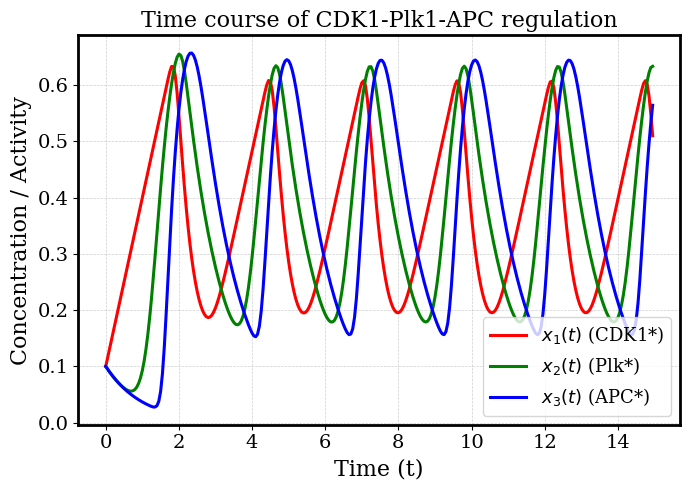

In [15]:
# -------------------------------
#  Generate the Training Data
# --------------------------------
# Define the System of ODEs, x1 = CDK1*, x2 = Plk*,x3 = APC*
def three_dim(state, t):
    x1, x2, x3  = state
    dx1_dt = alpha1 - beta1*x1*x3**n1/(K1**n1 + x3**n1)
    dx2_dt = alpha2*(1 - x2)*x1**n2/(K2**n2 + x1**n2) -beta2*x2
    dx3_dt = alpha3*(1 - x3)*x2**n3/(K3**n3 + x2**n3) -beta3*x3
    return [dx1_dt, dx2_dt, dx3_dt]
    

# Initial conditions
x0 = [0.1,0.1,0.1]
## Time points for the simulation
dt = 0.05
t0 = 0
tf= 50
t = np.arange(t0, tf + dt, dt)
## Solve the ODEs
x_train  = odeint(three_dim, x0, t)

print(f'\nThe shape of the Training Data is: {x_train.shape}')
# Time series plot
fig, ax = plt.subplots(figsize=(7, 5), dpi=100)
# Plot x1(t)
ax.plot(t[:300], x_train[:300, 0], 'r-', label='$x_1(t)$ (CDK1*)')
# Plot x2(t)
ax.plot(t[:300], x_train[:300, 1], 'g-', label='$x_2(t)$ (Plk*)')
# Plot x3(t)
ax.plot(t[:300], x_train[:300, 2], 'b-', label='$x_3(t)$ (APC*)')
# Labels, title, legend, grid
ax.grid(True, which='both', ls='--', lw=0.5)
# Axis labels and title
ax.set_xlabel('Time (t)')
ax.set_ylabel('Concentration / Activity')
ax.set_title('Time course of CDK1-Plk1-APC regulation')
# Legend 
ax.legend()
# Thick black spines 
set_spines_black(ax)
plt.tight_layout()
plt.savefig("Plots_4/TimeSeries_CDK1_Plk1-APC.pdf", bbox_inches="tight")
plt.show()


In [16]:
# -----------------------------------
#  Create library : Theta(x, x_dot)
# -----------------------------------

# ***For x1 variable:***

In [17]:
library_x1 =[   
    lambda x1, x2, x3: x3**8,
    lambda x1, x2, x3: x1*x3**8
]
library_x1dot = [
    lambda x1, x2, x3: x1
]
library_name_x1 = [
    lambda x1, x2, x3: x3+x3+x3+x3+x3+x3+x3+x3,
    lambda x1, x2, x3: x1+x3+x3+x3+x3+x3+x3+x3+x3,
    lambda x1, x2, x3: x1
]

theta_x1 = ps.SINDyPILibrary(
        library_functions=library_x1,
        x_dot_library_functions=library_x1dot,
        t=t,
        function_names=library_name_x1,
        include_bias=True,
    )
# Explicitly fit the library to the training data
theta_x1.fit(x_train)
    
# Print feature names as in original code
print("Candidates in the library for x1 are:")
print(get_reformatted_feature_names(theta_x1.get_feature_names()))
print("-"* 60)
print(f"and Total number of Candidates in the library is: {len(theta_x1.get_feature_names())}")

Candidates in the library for x1 are:
['1', 'x2**8', 'x0*x2**8', 'x0_dot', 'x0_dot*x2**8', 'x0*x0_dot*x2**8']
------------------------------------------------------------
and Total number of Candidates in the library is: 6


# ***For x2 variable:***

In [18]:
library_x2 = [
    lambda x1, x2, x3: x1**8,          
    lambda x1, x2, x3: x2,             
    lambda x1, x2, x3: x1**8*x2   
]

library_x2dot = [lambda x1, x2, x3: x2 ]
library_name_x2 =  [
    lambda x1, x2, x3: x1+x1+x1+x1+x1+x1+x1+x1,
    lambda x1, x2, x3: x2,
    lambda x1, x2, x3: x1+x1+x1+x1+x1+x1+x1+x1+x2,
    lambda x1, x2, x3: x2]
theta_x2 = ps.SINDyPILibrary(
        library_functions=library_x2,
        x_dot_library_functions=library_x2dot,
        t=t,
        function_names=library_name_x2,
        include_bias=False,
    )
# Explicitly fit the library to the training data
theta_x2.fit(x_train)
    
# Print feature names as in original code
print("Candidates in the library for x2 are:")
print(get_reformatted_feature_names(theta_x2.get_feature_names()))
print("-"* 60)
print(f"and Total number of Candidates in the library is: {len(theta_x2.get_feature_names())}")

Candidates in the library for x2 are:
['x0**8', 'x1', 'x0**8*x1', 'x1_dot', 'x0**8*x1_dot', 'x1*x1_dot', 'x0**8*x1*x1_dot']
------------------------------------------------------------
and Total number of Candidates in the library is: 7


# ***For x3 variable:***

In [19]:
library_x3 = [
    lambda x1, x2, x3: x2**8,           
    lambda x1, x2, x3: x2**8*x3,     
    lambda x1, x2, x3: x3 ]

library_x3dot = [lambda x1, x2, x3: x3]
library_name_x3 =  [
    lambda x1, x2, x3: x2+x2+x2+x2+x2+x2+x2+x2,
    lambda x1, x2, x3: x2+x2+x2+x2+x2+x2+x2+x2+x3,
    lambda x1, x2, x3: x3,
    lambda x1, x2, x3: x3]
theta_x3 = ps.SINDyPILibrary(
        library_functions=library_x3,
        x_dot_library_functions=library_x3dot,
        t=t,
        function_names=library_name_x3,
        include_bias=False,
    )
# Explicitly fit the library to the training data
theta_x3.fit(x_train)
    
# Print feature names as in original code
print("Candidates in the library for x3 are:")
print(get_reformatted_feature_names(theta_x3.get_feature_names()))
print("-"* 60)
print(f"and Total number of Candidates in the library is: {len(theta_x3.get_feature_names())}")

Candidates in the library for x3 are:
['x1**8', 'x1**8*x2', 'x2', 'x2_dot', 'x1**8*x2_dot', 'x1**8*x2*x2_dot', 'x2*x2_dot']
------------------------------------------------------------
and Total number of Candidates in the library is: 7


# ***For x1 variable:***

In [20]:
# Define threshold
threshold_values=np.logspace(-6, -2, 30)
feature_names= ["x1", "x2", "x3"]

In [21]:
# Perform grid search
mses_1, rel_errs_1, nonzeros_1, aics_1, bics_1, best_threshold_1 = optimize_threshold(
    library=theta_x1,
    x_train=x_train,
    t=t,
    threshold_values=threshold_values,
    feature_names= feature_names
)


Threshold grid search:   0%|          | 0/30 [00:00<?, ?it/s]

Model  0
Solver failed on model  0 , setting coefs to zeros
Model  1
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  0
Solver failed on model  0 , setting coefs to zeros
Model  1
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  0
Solver failed on model  0 , setting coefs to zeros
Model  1
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  0
Solver failed on model  0 , setting coefs to zeros
Model  1
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  0
Solver failed on model  0 , setting coefs to zeros
Model  1
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  0
Solver failed on model  0 , setting coefs to zeros
Model  1
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  0
Solver failed on model  0 , setting coefs to zeros
Mode

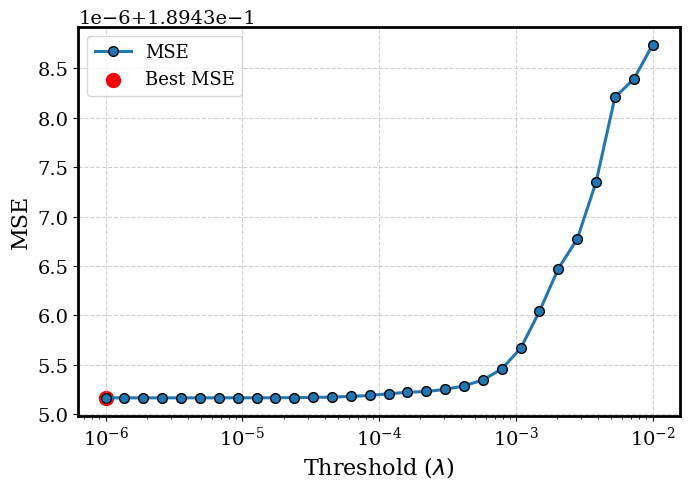

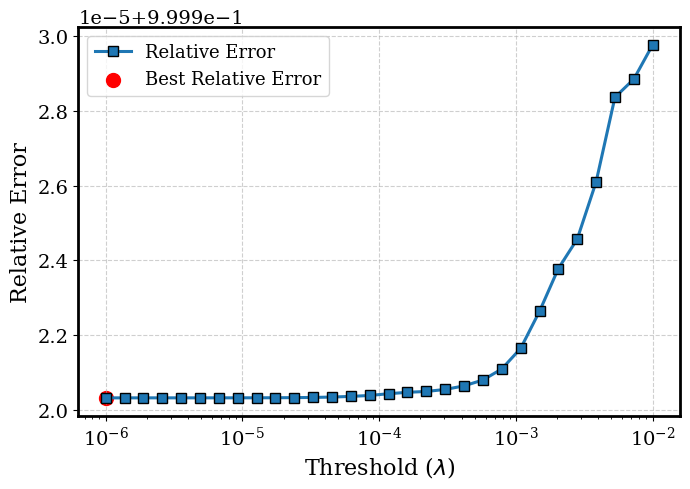

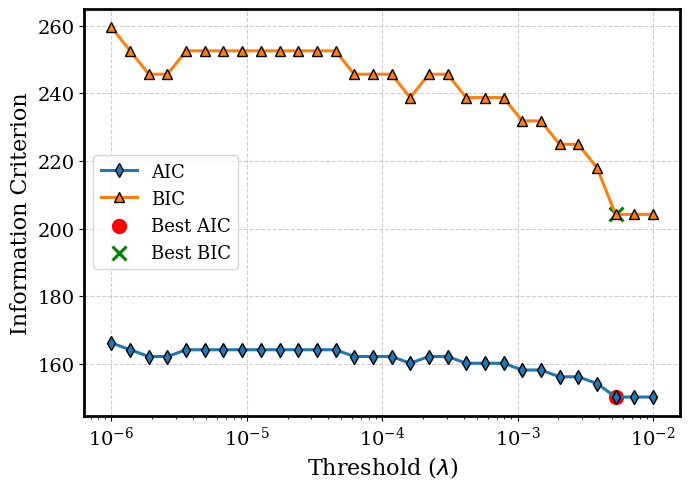

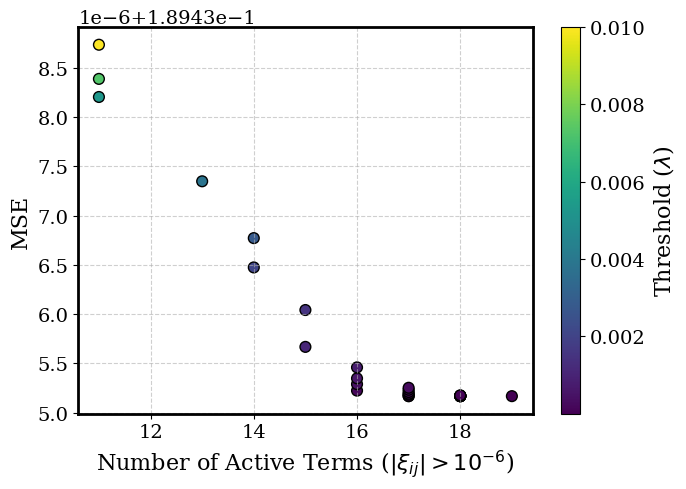

In [22]:
# Plot the results
plot_threshold_diagnostics(threshold_values,mses_1,rel_errs_1,aics_1,bics_1,nonzeros_1,dpi=100)


In [23]:
# Populate the result into table
table_best_thresholds(threshold_values, mses_1, rel_errs_1, aics_1, bics_1)


Best Thresholds for each metric:
Best Threshold (based on MSE)         : 1e-06
Best Threshold (based on Relative Error) : 1e-06
Best Threshold (based on AIC)         : 0.005298
Best Threshold (based on BIC)         : 0.005298



In [24]:
features_x1, coefficients_x1, per_eq_results_1 = evaluate_model_per_equation(
    library = theta_x1,
    x_train= x_train,
    t = t,                                   
    best_threshold =1e-06,
    feature_names =["x1", "x2", "x3"]
)


Model  0
Solver failed on model  0 , setting coefs to zeros
Model  1
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5

Models sorted by lowest Relative Error (lambda=1e-06):


,Eq,Feature,R Square,Relative Error,AIC,BIC,Active Terms (Implicit Equation)
2,2,x1*x3**8,1.0000,2.2844e-03,-23400.6179,-23376.0742,5
4,4,x1_dot*x3**8,1.0000,4.3312e-03,-21117.1603,-21097.5253,4
1,1,x3**8,0.9999,7.0396e-03,-18897.0102,-18872.4664,5
5,5,x1*x1_dot*x3**8,0.9958,5.7529e-02,-17939.9037,-17915.3599,5
3,3,x1_dot,-0.0003,1.0000e+00,-1992.6086,-1992.6086,0
0,0,1,0.0000,1.0000e+00,0.0000,0.0000,0


In [25]:
#####################################################################################################################################################
#                                               IIIa.   Implicit to explicit conversion for x_1
#
#####################################################################################################################################################

In [26]:
left_coeff_x1 = generate_identity_matrix(features_x1)
right_coeff_x1 = coefficients_x1
eq_list_x1, token_symbols_x1 = generate_symbolic_equations_both_sides(
    features_x1,
    left_coeff_x1,
    right_coeff_x1
)

In [27]:
# Print the store models
raw_x1, rescaled_x1, cleaned_x1, final_model_x1 = print_and_store_models(
    eq_list=eq_list_x1,
    xdot_symbol=token_symbols_x1['x1_dot'],
    target=x3**8,
    gens=(x1,x2,x3),
    sig_digits=4,
    tol=1e-6,
    latex_path="Examples_Related/Ex_4_latex_x1.txt",
    csv_path="Examples_Related/Ex_4_x1.csv"
)


Model 0: No solution.
Model 1:
          -3.138*x1*x3**8 + 0.3187*x3**8 + 0.001227
x1_dot = -----------------------------------------
          0.1055*x1*x3**8 + 1.0*x3**8 + 0.004132
[Terms: numerator=3, denominator=3]
Model 2:
          -3.026*x1*x3**8 + 0.299*x3**8 + 0.001211
x1_dot = ----------------------------------------
          0.02599*x1*x3**8 + 1.0*x3**8 + 0.004077
[Terms: numerator=3, denominator=3]
Model 3: Solver failed (zero numerator).
Model 4:
          -2.987*x1*x3**8 + 0.292*x3**8 + 0.001203
x1_dot = ----------------------------------------
          1.0*x3**8 + 0.004049
[Terms: numerator=3, denominator=2]
Model 5:
          10.77*x1*x3**8 - 2.103*x3**8 - 0.0009462
x1_dot = ----------------------------------------
          -9.855*x1*x3**8 + 1.0*x3**8 - 0.002959
[Terms: numerator=3, denominator=3]

 Total models processed: 6
 Models obtained      : 4
 Models failed        : 2



In [28]:
# dx1_dt as a single rational function with:
#   Numerator: -3.0*x1*x3**8 + 0.3*x3**8 + 0.001171875
#   Denominator: 1.0*x3**8 + 0.00390625

In [29]:
# Model 1 , 2, 4 are the only models with non negative term in the denominator without singularity.

In [30]:
#********************************************************************************************************************************************************

# ***For x2 variable:***

In [31]:
# Perform grid search
threshold_values=np.logspace(-8, -3, 30)
mses_2, rel_errs_2, nonzeros_2, aics_2, bics_2, best_threshold_2 = optimize_threshold(
    library=theta_x2,
    x_train=x_train,
    t=t,
    threshold_values=threshold_values,
    feature_names = ["x1", "x2", "x3"],
    show_progress = True   
)

Threshold grid search:   0%|          | 0/30 [00:00<?, ?it/s]

Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Solver failed on model  5 , setting coefs to zeros
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Solver failed on model  5 , setting coefs to zeros
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Solver failed on model  5 , setting coefs to zeros
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Solver failed on model  5 , setting coefs to zeros
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zero

/home/alka23224/miniconda3/envs/implicit_sindy/lib/python3.10/site-packages/cvxpy/problems/problem.py:1504: UserWarning:

Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.



Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
M

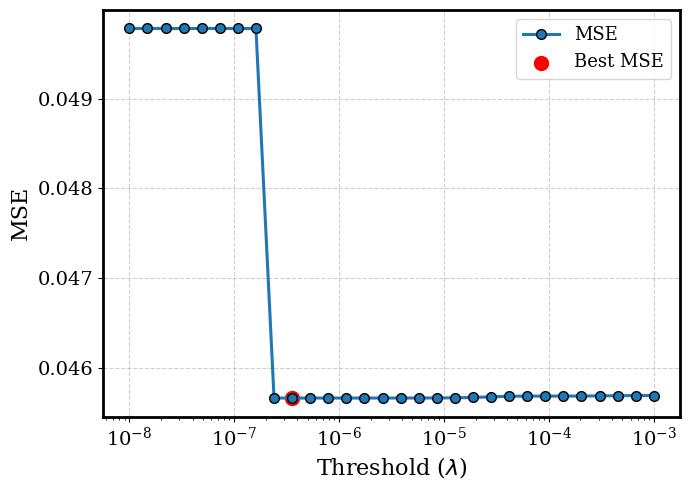

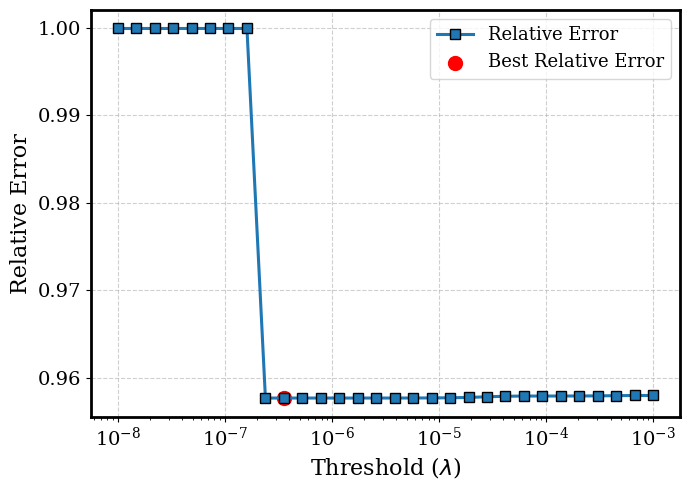

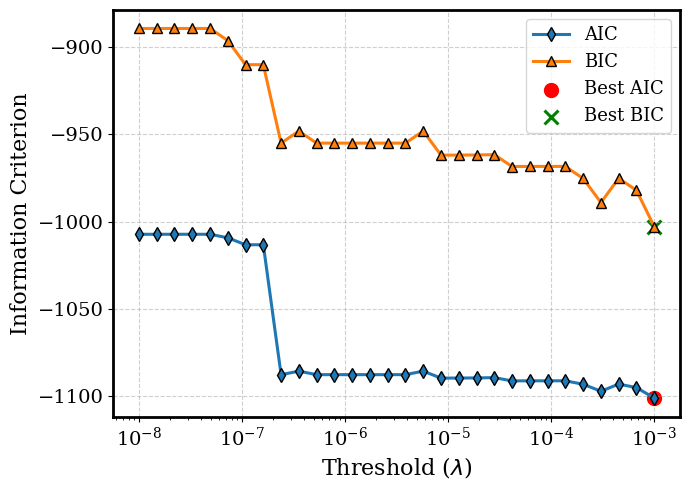

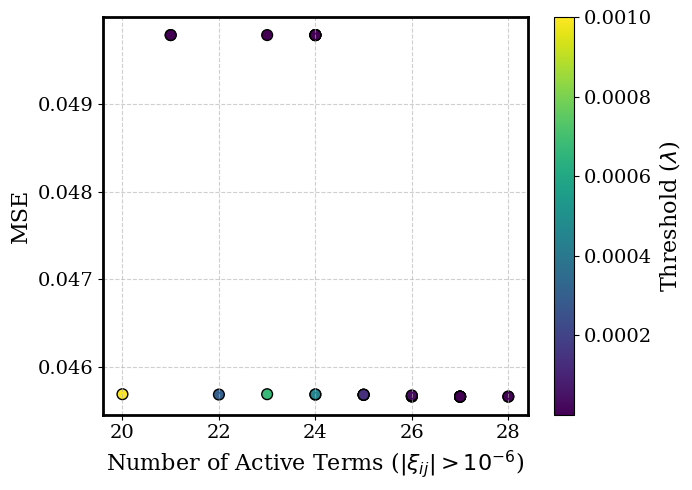

In [32]:
# Plot the results
plot_threshold_diagnostics(threshold_values,mses_2,rel_errs_2,aics_2,bics_2,nonzeros_2,dpi=100)

In [33]:
# Populate the result into table
table_best_thresholds(threshold_values, mses_2, rel_errs_2, aics_2, bics_2)



Best Thresholds for each metric:
Best Threshold (based on MSE)         : 3.562e-07
Best Threshold (based on Relative Error) : 3.562e-07
Best Threshold (based on AIC)         : 0.001
Best Threshold (based on BIC)         : 0.001



In [34]:
# Fit the model for best threshold chosen
features_x2, coefficients_x2, per_eq_results_2 = evaluate_model_per_equation(
    library = theta_x2,
    x_train= x_train,
    t = t,
    best_threshold =3.562e-07,
    feature_names =["x1", "x2", "x3"]
)


Model  0
Model  1
Solver failed on model  1 , setting coefs to zeros
Model  2
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6

Models sorted by lowest Relative Error (lambda=3.562e-07):


,Eq,Feature,R Square,Relative Error,AIC,BIC,Active Terms (Implicit Equation)
0,0,x1**8,1.0000,6.1461e-04,-25010.9510,-24986.4072,5
2,2,x1**8*x2,1.0000,8.2325e-04,-25580.8872,-25556.3434,5
4,4,x1**8*x2_dot,1.0000,4.1573e-03,-22633.9099,-22604.4574,6
6,6,x1**8*x2*x2_dot,0.9982,3.8781e-02,-19439.7505,-19415.2067,5
5,5,x2*x2_dot,0.9731,1.6393e-01,-7129.8425,-7095.4812,7
3,3,x2_dot,-0.0000,1.0000e+00,-1848.8411,-1848.8411,0
1,1,x2,-5.3825,1.0000e+00,-1827.1986,-1827.1986,0


In [35]:
left_coeff_x2 = generate_identity_matrix(features_x2)
right_coeff_x2 = coefficients_x2
eq_list_x2, token_symbols_x2 = generate_symbolic_equations_both_sides(
    features_x2, 
    left_coeff_x2,
    right_coeff_x2
)


In [36]:
# Print the models
raw_x2, rescaled_x2, cleaned_x2, final_model_x2 = print_and_store_models(
    eq_list=eq_list_x2,
    xdot_symbol=token_symbols_x2['x2_dot'],
    target=x1**8,
    gens=(x1,x2,x3),
    sig_digits=4,
    tol=1e-6, 
    latex_path="Examples_Related/Ex_4_latex_x2.txt",
    csv_path="Examples_Related/Ex_4_x2.csv"
)


Model 0:
          -4.031*x1**8*x2 + 3.019*x1**8 - 0.00395*x2
x2_dot = ------------------------------------------
          1.0*x1**8 + 0.0001882*x2 + 0.003896
[Terms: numerator=3, denominator=3]
Model 1: No solution.
Model 2:
          -4.035*x1**8*x2 + 3.021*x1**8 - 0.003951*x2
x2_dot = -------------------------------------------
          1.0*x1**8 + 0.0001796*x2 + 0.003903
[Terms: numerator=3, denominator=3]
Model 3: Solver failed (zero numerator).
Model 4:
          -3.671*x1**8*x2 + 2.733*x1**8 - 0.003471*x2
x2_dot = ----------------------------------------------------
          -0.1881*x1**8*x2 + 1.0*x1**8 + 6.825e-5*x2 + 0.00346
[Terms: numerator=3, denominator=4]
Model 5:
          -4.088*x1**8*x2 + 3.068*x1**8 - 0.004095*x2
x2_dot = -----------------------------------------------------
          0.01309*x1**8*x2 + 1.0*x1**8 + 0.000948*x2 + 0.003724
[Terms: numerator=3, denominator=4]
Model 6:
          -0.1877*x1**8 + 0.001385*x2
x2_dot = -------------------------------------

In [37]:
# 0, 2, 5

In [38]:
#*****************************************************************************************************************************************

# ***For x3 variable:***

In [39]:
# Perform grid search
threshold_values=np.logspace(-6, -3, 20)
mses_3, rel_errs_3, nonzeros_3, aics_3, bics_3, best_threshold_3 = optimize_threshold(
    library = theta_x3,
    x_train = x_train,
    t = t,
    threshold_values = threshold_values,
    feature_names = ["x1","x2","x3"],
    show_progress = True   
)

Threshold grid search:   0%|          | 0/20 [00:00<?, ?it/s]

Model  0
Model  1
Model  2
Solver failed on model  2 , setting coefs to zeros
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Model  2
Solver failed on model  2 , setting coefs to zeros
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Model  2
Solver failed on model  2 , setting coefs to zeros
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Model  2
Solver failed on model  2 , setting coefs to zeros
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Model  2
Solver failed on model  2 , setting coefs to zeros
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
Model  1
Model  2
Solver failed on model  2 , setting coefs to zeros
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6
Model  0
M

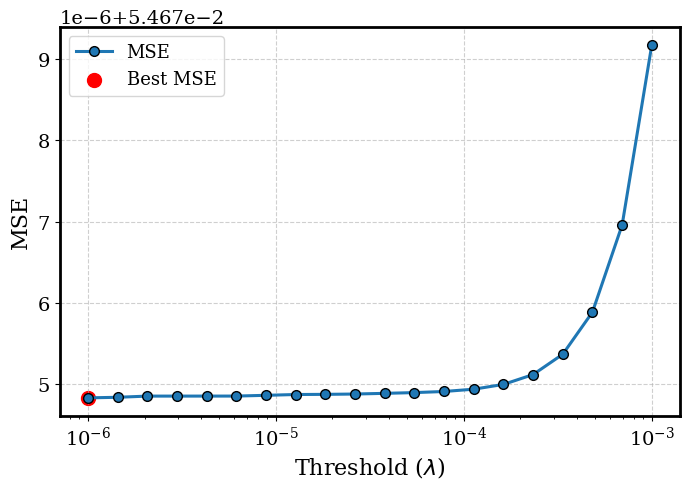

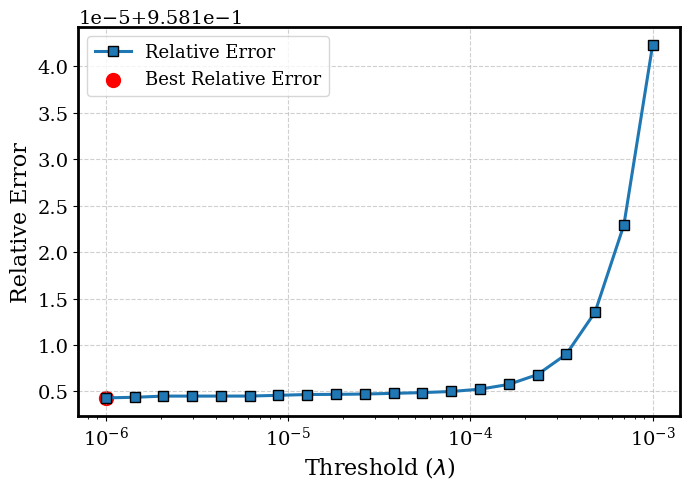

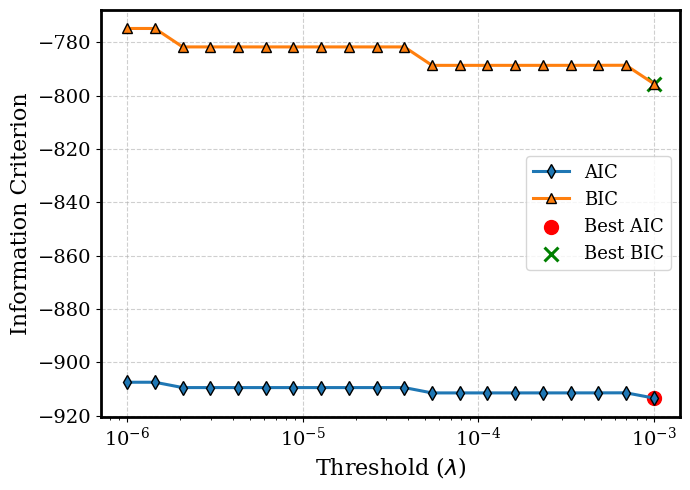

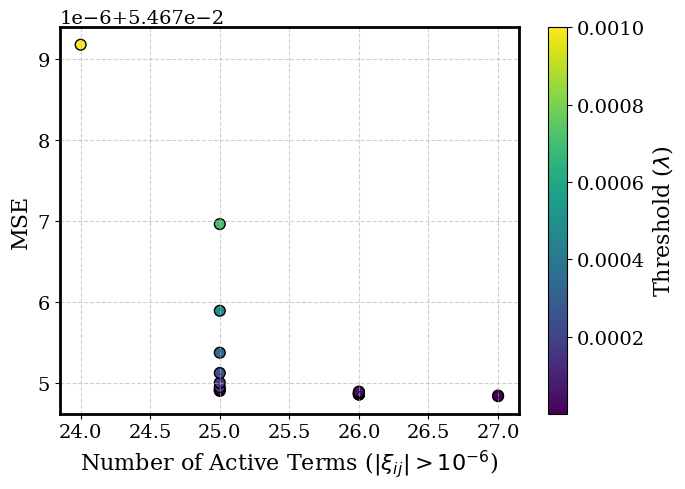

In [40]:
# Plot the results
plot_threshold_diagnostics(threshold_values,mses_3,rel_errs_3,aics_3,bics_3,nonzeros_3,dpi =100)

In [41]:
# Populate the result into table
table_best_thresholds(threshold_values, mses_3, rel_errs_3, aics_3, bics_3)


Best Thresholds for each metric:
Best Threshold (based on MSE)         : 1e-06
Best Threshold (based on Relative Error) : 1e-06
Best Threshold (based on AIC)         : 0.001
Best Threshold (based on BIC)         : 0.001



In [42]:
# Fit the model for best threshold chosen
features_x3, coefficients_x3, per_eq_results_3 = evaluate_model_per_equation(
    library = theta_x3,
    x_train= x_train,
    t = t,
    best_threshold = 1e-06,
    feature_names =["x1", "x2", "x3"]
)


Model  0
Model  1
Model  2
Solver failed on model  2 , setting coefs to zeros
Model  3
Solver failed on model  3 , setting coefs to zeros
Model  4
Model  5
Model  6

Models sorted by lowest Relative Error (lambda=1e-06):


,Eq,Feature,R Square,Relative Error,AIC,BIC,Active Terms (Implicit Equation)
0,0,x2**8,1.0000,8.5996e-04,-23582.3108,-23557.7670,5
1,1,x2**8*x3,1.0000,1.1897e-03,-24148.4054,-24123.8616,5
4,4,x2**8*x3_dot,1.0000,3.2578e-03,-21765.3196,-21735.8671,6
5,5,x2**8*x3*x3_dot,0.9974,4.6668e-02,-17848.2098,-17823.6660,5
6,6,x3*x3_dot,0.9735,1.6284e-01,-6977.6839,-6948.2314,6
2,2,x3,-4.7350,1.0000e+00,-1736.8411,-1736.8411,0
3,3,x3_dot,-0.0000,1.0000e+00,-1584.3081,-1584.3081,0


In [43]:
left_coeff_x3 = generate_identity_matrix(features_x3)
right_coeff_x3 = coefficients_x3
eq_list_x3, token_symbols_x3 = generate_symbolic_equations_both_sides(features_x3, left_coeff_x3, right_coeff_x3)


In [44]:
# Print the models
raw_x3, rescaled_x3, cleaned_x3, final_model_x3 = print_and_store_models(
    eq_list=eq_list_x3,
    xdot_symbol=token_symbols_x3['x3_dot'],
    target=x2**8,
    gens=(x1,x2,x3),
    sig_digits=4,
    tol=1e-6, 
    latex_path="Examples_Related/Ex_4_latex_x3.txt",
    csv_path="Examples_Related/Ex_4_x3.csv"
)


Model 0:
          -3.979*x2**8*x3 + 2.993*x2**8 - 0.003982*x3
x3_dot = -------------------------------------------
          1.0*x2**8 + 0.0001612*x3 + 0.003944
[Terms: numerator=3, denominator=3]
Model 1:
          -3.982*x2**8*x3 + 2.994*x2**8 - 0.003976*x3
x3_dot = -------------------------------------------
          1.0*x2**8 + 0.0001173*x3 + 0.003957
[Terms: numerator=3, denominator=3]
Model 2: No solution.
Model 3: Solver failed (zero numerator).
Model 4:
          -3.733*x2**8*x3 + 2.785*x2**8 - 0.003529*x3
x3_dot = -----------------------------------------------------
          -0.1531*x2**8*x3 + 1.0*x2**8 - 0.000104*x3 + 0.003588
[Terms: numerator=3, denominator=4]
Model 5:
          -0.452*x2**8*x3 + 0.00246*x3
x3_dot = ----------------------------------------------------
          -2.236*x2**8*x3 + 1.0*x2**8 - 0.003179*x3 - 0.001243
[Terms: numerator=2, denominator=4]
Model 6:
          -1.52*x2**8*x3 + 0.7455*x2**8 + 0.002892*x3
x3_dot = ----------------------------------

In [45]:
#####################################################################################################################################################
#                                                   IV. Select a model and simulate it.
#
#####################################################################################################################################################


==== MODEL : For x1: 1, for x2: 0 and for x3: 1 ====
x1_dot = (-3.138*x1*x3**8 + 0.3187*x3**8 + 0.001227)/(0.1055*x1*x3**8 + 1.0*x3**8 + 0.004132)
x2_dot = (-4.031*x1**8*x2 + 3.019*x1**8 - 0.00395*x2)/(1.0*x1**8 + 0.0001882*x2 + 0.003896)
x3_dot = (-3.982*x2**8*x3 + 2.994*x2**8 - 0.003976*x3)/(1.0*x2**8 + 0.0001173*x3 + 0.003957)


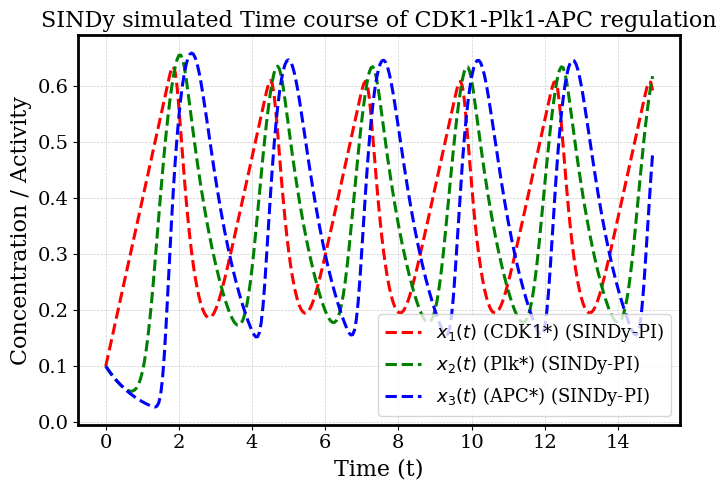

In [46]:
select_index_x1 = 1  # Model 1 , 2, 4
select_index_x2 = 0 # Model 0, 2,5
select_index_x3 = 1 # Model 0, 1
x1_dot_solution = final_model_x1[select_index_x1]
x2_dot_solution = final_model_x2[select_index_x2]
x3_dot_solution = final_model_x3[select_index_x3]
######################################################################################

f_x1_dot = sp.lambdify((x1, x2, x3), x1_dot_solution, 'numpy')
f_x2_dot = sp.lambdify((x1, x2, x3), x2_dot_solution, 'numpy')
f_x3_dot = sp.lambdify((x1, x2, x3), x3_dot_solution, 'numpy')

# Define the system for numerical integration
def sindy_func(state, t):
    x1_val, x2_val, x3_val = state  # Unpack state variables
    dx1_dt = f_x1_dot(x1_val, x2_val, x3_val)
    dx2_dt = f_x2_dot(x1_val, x2_val, x3_val)
    dx3_dt = f_x3_dot(x1_val, x2_val, x3_val)
    return [dx1_dt, dx2_dt, dx3_dt]

# Initial conditions
z0 = [0.1, 0.1, 0.1]
## Time points for the simulation
dt = 0.05
t = np.arange(0, 50 + dt, dt)

solution = odeint(sindy_func, z0, t)


print(f"\n==== MODEL : For x1: {select_index_x1}, for x2: {select_index_x2} and for x3: {select_index_x3} ====")
print("x1_dot =", x1_dot_solution)
print("x2_dot =", x2_dot_solution)
print("x3_dot =", x3_dot_solution)

## Time series plot
fig, ax = plt.subplots(figsize=(7, 5), dpi=100)
# Plot x1(t)
ax.plot(t[:300], solution[:300, 0], 'r--', label='$x_1(t)$ (CDK1*) (SINDy-PI)')
# Plot x2(t)
ax.plot(t[:300], solution[:300, 1], 'g--', label='$x_2(t)$ (Plk*) (SINDy-PI)')
# Plot x3(t)
ax.plot(t[:300], solution[:300, 2], 'b--', label='$x_3(t)$ (APC*) (SINDy-PI)')
# Labels, title, legend, grid
ax.grid(True, which='both', ls='--', lw=0.5)
# Axis labels and title
ax.set_xlabel('Time (t)')
ax.set_ylabel('Concentration / Activity')
ax.set_title('SINDy simulated Time course of CDK1-Plk1-APC regulation')
# Legend 
ax.legend(loc='best')
# Thick black spines 
set_spines_black(ax)
plt.tight_layout()
plt.savefig("Plots_4/SINDy_TimeSeries_CDK1_Plk1_APC.pdf", bbox_inches="tight")
plt.show()


In [47]:
###########################################################################################################

In [48]:
def ss_func_sindy(vars):
    x1_val, x2_val, x3_val = vars
    dx1 = f_x1_dot(x1_val, x2_val, x3_val)
    dx2 = f_x2_dot(x1_val, x2_val, x3_val)
    dx3 = f_x3_dot(x1_val, x2_val, x3_val)
    return [dx1, dx2, dx3]

sindy_ss = find_steady_states(
    ss_func_sindy,
    num_vars=3,
    num_samples=1000,         
    tol=1e-8,
    domain=[(0, 1), (0, 1), (0, 1)] 
)

# --------------------------------------
# Print the found steady states
# --------------------------------------
print("Steady states found numerically:")
for ss in sindy_ss:
    x1_ss, x2_ss, x3_ss = ss
    print(f"[{x1_ss:.3f}, {x2_ss:.3f}, {x3_ss:.3f}]")


Steady states found numerically:
[0.439, 0.437, 0.430]


In [49]:
# ------------------------------
# Define the Jacobian matrix of the system
# ------------------------------
f_SINDy = sp.Matrix([x1_dot_solution, x2_dot_solution, x3_dot_solution])
J_SINDy = f_SINDy.jacobian(vars).applyfunc(lambda expr: expr.evalf(3))

# display(J_SINDy)

In [50]:
J_SINDy_at_ss = []

for i, s in enumerate(sindy_ss, 1):
    val1, val2, val3 = s

    # Substitute steady state into the Jacobian
    subs_dict = {x1: val1, x2: val2, x3: val3}
    J_SINDy_sub = J_SINDy.subs(subs_dict)
    
    # Evaluate Jacobian and eigenvalues
    eigs = J_SINDy_sub.eigenvals()
    J_SINDy_eval = J_SINDy_sub.evalf(3)
    J_SINDy_at_ss.append(J_SINDy_eval)

    # Print Jacobian
    print(f"\nJacobian at SS {i} = ({val1:.3f}, {val2:.3f}, {val3:.3f}):")
    sp.pprint(J_SINDy_eval)

    # Print eigenvalues
    print(f"Eigenvalues at SS {i}:")
    for ev, mult in eigs.items():
        print(f"  {ev.evalf(3)}  (×{mult})")



Jacobian at SS 1 = (0.439, 0.437, 0.430):
⎡-0.681    0    -4.28⎤
⎢                    ⎥
⎢ 5.88   -1.77    0  ⎥
⎢                    ⎥
⎣  0     5.86   -1.74⎦
Eigenvalues at SS 1:
  -6.7 - 4.83e-64*I  (×1)
  1.26 - 4.55*I  (×1)
  1.26 + 4.55*I  (×1)



Interaction network near SS 1 = (0.439, 0.437, 0.430):


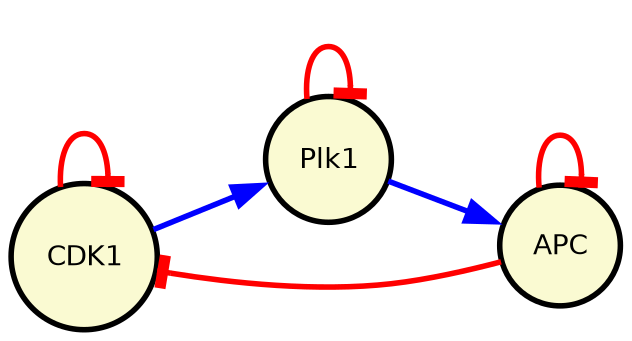

In [51]:

nodes = ["CDK1","Plk1", "APC"]# ----------------------------------
#  Visualize interaction networks 
# ----------------------------------
try:
    Jacobians_np = [np.array(J_ss.tolist(), dtype=float) for J_ss in J_SINDy_at_ss]
    for i, (J_np, ss_point) in enumerate(zip(Jacobians_np, sindy_ss), 1):
        output_path = f"Plots_4/SINDy_CDK1_Plk1_APC_network_{i}"
        graph = draw_network(
            J_np,
            nodes=nodes,
            output_path=output_path,
            label_fontsize=10,
            graph_size='10,10',
            dpi=200
        )

        coord_str = ', '.join(f"{N(v, 3)}" for v in ss_point)
        print(f"\nInteraction network near SS {i} = ({coord_str}):")
        display(Image(filename=output_path + '.png'))

except Exception as e:
    print(f" Can't  Draw the Network: {e}")

In [52]:
#**********************************************************************************************************************************************